# Data Augmentation for Class-Imbalanced Crop-Weed Detection

## Experiment Overview

This notebook implements an intelligent undersampling technique for addressing class imbalance in agricultural object detection datasets. The primary objective is to reduce the dominance of majority crop classes while preserving all minority weed instances, which are critical for effective weed detection systems.

**Key Contributions:**
- Novel edge-based crop removal algorithm that prioritizes ecological context
- Safety-first approach prioritizing weed instance preservation
- Iterative refinement maintaining dataset spatial characteristics
- Comprehensive validation through statistical analysis

**Dataset Source:** https://data.mendeley.com/datasets/mthv4ppwyw/2

In [1]:
import os
import glob
import numpy as np
import cv2  
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter  
from tqdm import tqdm
import random
from pathlib import Path
import pandas as pd
import shutil
from sklearn.model_selection import train_test_split
import json
from typing import List, Dict, Tuple

import warnings
warnings.filterwarnings('ignore')

sns.set_style("darkgrid") 
sns.set_palette("husl")

## Import Dependencies

The following libraries are essential for:
- **Image Processing**: OpenCV (cv2) for image manipulation
- **Data Analysis**: NumPy, Pandas for numerical operations and statistics
- **Visualization**: Matplotlib, Seaborn for generating plots
- **Dataset Management**: Pathlib, Shutil for file operations
- **Machine Learning**: Scikit-learn for train-test splitting strategies

# Configuration - Dataset Selection

In [32]:
CROP_TYPE = "Black bean"  # Options: "Corn", "Soybean", "Canola", etc.

# Dataset paths
DATASET_ROOT = Path("Weed-crop RGB dataset")
DATASET_PATH = DATASET_ROOT / CROP_TYPE

print(f"Using dataset: {CROP_TYPE}")
print(f"Dataset path: {DATASET_PATH}")

WEED_CLASS_IDS = [
    5,  # Horseweed
    6,  # Kochia
    8,  # Ragweed
    9,  # Redroot Pigweed
    12  # Waterhemp
]

Using dataset: Black bean
Dataset path: Weed-crop RGB dataset\Black bean


### Experimental Configuration

**Target Crop:** Black bean  
**Rationale:** Selected as representative case study for demonstrating the augmentation methodology. The algorithm is designed to be crop-agnostic and can be applied to any crop type in the dataset.

**Weed Classes of Interest:**
The five weed species represent common agricultural threats with varying detection difficulties due to their morphological characteristics and growth patterns.

Classes name standarization - so that they have equal names that are compatible with folder names, so that logic of the code works.

In [33]:
VALID_CLASSES_NAMES = [
    "Black bean", "Canola", "Corn", "Field Pea", "Flax", 
    "Lentil", "Soybean", "Sugar beet", "Horseweed", 
    "Kochia", "Ragweed", "Redroot Pigweed", "Waterhemp"
]


def normalize_string(s):
    return s.lower().replace(" ", "").replace("_", "").strip()

def fix_classes_file_content(file_path, valid_names):
    if not file_path.exists():
        print(f"Error: Classes file not found at {file_path}")
        return

    with open(file_path, 'r') as f:
        original_lines = f.readlines()

    new_lines = []
    changes_count = 0
    
    for line in original_lines:
        original_name = line.strip()
        normalized_current = normalize_string(original_name)
        found_match = False

        for folder_name in valid_names:
            normalized_folder = normalize_string(folder_name)
            
            if normalized_current == normalized_folder:
                if original_name != folder_name:
                    print(f"Poprawiam: '{original_name}' -> '{folder_name}'")
                    changes_count += 1
                
                new_lines.append(folder_name + "\n")
                found_match = True
                break

        if not found_match:
            new_lines.append(original_name + "\n")

    with open(file_path, 'w') as f:
        f.writelines(new_lines)

In [34]:
def load_classes(dataset_root):
    """Load class names from classes.txt"""
    classes_file = dataset_root / "classes.txt"
    
    if not classes_file.exists():
        # Try to find it in subdirectories
        for crop_folder in dataset_root.iterdir():
            if crop_folder.is_dir():
                alt_classes = crop_folder / "classes.txt"
                if alt_classes.exists():
                    classes_file = alt_classes
                    break
    
    if classes_file.exists():
        with open(classes_file, 'r') as f:
            classes = [line.strip() for line in f.readlines()]
        return classes
    else:
        print("classes.txt not found. Using default class order.")
        return None

# Load classes
CLASS_NAMES = load_classes(DATASET_ROOT)

Selected crop dataset will be used for analysis, augmentation, and to train and test the models.

### Data split   

### Stratified Data Splitting Strategy

**Methodology:** Rare-class prioritized random splitting

The data split algorithm ensures that rare weed classes are proportionally represented across train, validation, and test sets. This is crucial because:

1. **Prevents Data Leakage**: Images containing rare instances are strategically distributed
2. **Maintains Representativeness**: Each split contains examples of all weed species
3. **Enables Fair Evaluation**: Test set reflects real-world class distribution

**Split Ratios (approximate):**
- Training: ~70%
- Validation: ~15%
- Testing: ~15%

Note: Actual ratios may vary slightly due to rare class prioritization and indivisible sample counts.

**Rare Class Threshold:** Classes with ≤5 instances receive special handling to prevent their complete absence from any split.

In [ ]:
def data_split(
    label_files: List[Path],
    file_classes_counts: Dict[Path, Counter],
    class_counts: Counter,
    val_ratio: float = 0.15,
    test_ratio: float = 0.15,
    rare_threshold: int = 5,
    seed: int = 27
) -> Tuple[List[Path], List[Path], List[Path]]:
    """
    Improved Smart Random split strategy that prioritizes rare classes.
    
    This method ensures that files containing rare weed instances are distributed
    across train/val/test sets to maintain representativeness.
    
    Args:
        seed: Fixed at 27 for reproducibility across experiments
    """
    
    #seed: int = 1500
    #seed: int = 1339
    #seed: int = 1337

    """
    Improved Smart Random.
    - Prioritizes files containing rare classes.
    - Simple, robust fallback split.
    """

    random.seed(seed)

    # 1. Identify rare classes
    rare_classes = {c for c, total in class_counts.items() if total <= rare_threshold}

    # 2. Compute score for each file = how many rare-class instances it contains
    file_scores = []
    for f in label_files:
        counts = file_classes_counts.get(f, Counter())
        # number of rare classes present
        rare_unique = sum(1 for c in counts if c in rare_classes)
        # number of total rare instances
        rare_instances = sum(counts[c] for c in counts if c in rare_classes)
        file_scores.append((f, rare_unique, rare_instances))

    # 3. Sort:
    #    - first by number of rare UNIQUE classes (descending)
    #    - then by number of rare INSTANCES (descending)
    #    - then random tiebreaker
    random.shuffle(file_scores)  # ensures randomness inside ties
    file_scores.sort(key=lambda x: (x[1], x[2]), reverse=True)

    sorted_files = [f for (f, _, _) in file_scores]

    # 4. Compute sizes
    total_files = len(label_files)
    n_test = max(1, int(total_files * test_ratio))
    n_val = max(1, int(total_files * val_ratio))

    # 5. Assign
    test_files = sorted_files[:n_test]
    val_files = sorted_files[n_test:n_test + n_val]
    train_files = sorted_files[n_test + n_val:]

    return train_files, val_files, test_files

In [36]:
label_files = sorted([p for p in DATASET_PATH.glob("*.txt") if p.name != "classes.txt"])
file_classes_counts = {}
for f in label_files:
    class_ids = [int(line.split()[0]) for line in f.read_text().splitlines() if line.strip()]
    file_classes_counts[f] = Counter(class_ids)
class_counts = Counter()
for c in file_classes_counts.values():
    class_counts.update(c)

train_files, val_files, test_files = data_split(
    label_files,
    file_classes_counts,
    class_counts,
    val_ratio=0.15,
    test_ratio=0.15,
    rare_threshold=5  # Classes with ≤5 instances are considered rare
)

In [38]:
def get_class_ids_from_file(lbl_path: Path) -> List[int]:
    """
    Extract class IDs from a YOLO annotation file.
    
    Args:
        lbl_path: Path to the label file
        
    Returns:
        List of class IDs found in the file
    """
    try:
        with open(lbl_path, 'r') as f:
            return [int(line.split()[0]) for line in f if line.strip()]
    except FileNotFoundError:
        return []

def get_weed_counts_by_class(file_list: List[Path]) -> Counter:
    """
    Count weed instances across multiple label files.
    
    Args:
        file_list: List of label file paths
        
    Returns:
        Counter with weed class IDs and their counts
    """
    weed_counts = Counter()
    for lbl_path in file_list:
        class_ids = get_class_ids_from_file(lbl_path)
        for cls_id in class_ids:
            if cls_id in WEED_CLASS_IDS:
                weed_counts[cls_id] += 1
    return weed_counts

def count_weed_instances_in_splits(train_files: List[Path], val_files: List[Path], test_files: List[Path]) -> pd.DataFrame:

    train_counts = get_weed_counts_by_class(train_files)
    val_counts = get_weed_counts_by_class(val_files)
    test_counts = get_weed_counts_by_class(test_files)

    data = {
        "Train": train_counts,
        "Validation": val_counts,
        "Test": test_counts
    }

    df = pd.DataFrame.from_dict(data, orient="index").T
    df = df.fillna(0).astype(int)
    if isinstance(CLASS_NAMES, dict):
        class_map = {int(k): v for k, v in CLASS_NAMES.items()}
    else:
        class_map = {i: name for i, name in enumerate(CLASS_NAMES)}

    new_index = []
    for idx in df.index:
        if isinstance(idx, int) and idx in class_map:
            new_index.append(class_map[idx])
        else:
            new_index.append(str(idx))  

    df.index = new_index
    df.loc["TOTALS (Instance Count)"] = df.sum(numeric_only=True)

    return df

df_weed_distribution = count_weed_instances_in_splits(train_files, val_files, test_files)


print("\n--- Weeds distribution after split ---")
display(df_weed_distribution)


--- Weeds distribution after split ---


,Train,Validation,Test
Horseweed,38,9,5
Ragweed,77,20,20
Kochia,72,20,15
Waterhemp,77,17,14
Redroot Pigweed,68,6,10
TOTALS (Instance Count),332,72,64


### Weed Distribution Analysis

The following analysis quantifies weed instance distribution across the train/validation/test splits. This baseline measurement is critical for:

- Assessing split quality and representativeness
- Identifying potential class imbalance issues
- Establishing ground truth for post-augmentation comparison
- Validating that rare classes appear in all splits

In [39]:
def get_image_path(label_path: Path):
    """
    Finds the corresponding image file for a given YOLO label file path.
    """
    extensions = ['.JPG', '.jpg', '.PNG', '.png', '.jpeg', '.JPEG']
    for ext in extensions:
        img_path = label_path.with_suffix(ext)
        if img_path.exists():
            return img_path
    return None 

In [40]:

SPLIT_DIR = DATASET_ROOT / f"{CROP_TYPE}_augmented"

TRAIN_DIR = SPLIT_DIR / "train"
VAL_DIR = SPLIT_DIR / "valid"
TEST_DIR = SPLIT_DIR / "test"

os.makedirs(TRAIN_DIR, exist_ok=True)
os.makedirs(VAL_DIR, exist_ok=True)
os.makedirs(TEST_DIR, exist_ok=True)


def copy_files(file_list, dest_folder):
   
    for label_path in tqdm(file_list, desc=f"Copying data to {dest_folder.name}"):
        
        img_path = get_image_path(label_path) 
        
        if img_path and img_path.exists():
            shutil.copy(label_path, dest_folder / label_path.name)
            shutil.copy(img_path, dest_folder / img_path.name)
        else:
            print(f"No image found for label: {label_path.name}")

copy_files(train_files, TRAIN_DIR)
copy_files(val_files, VAL_DIR)
copy_files(test_files, TEST_DIR)

shutil.copy(DATASET_PATH / "classes.txt", SPLIT_DIR / "classes.txt")
shutil.copy(DATASET_PATH / "classes.txt", TRAIN_DIR / "classes.txt")
shutil.copy(DATASET_PATH / "classes.txt", VAL_DIR / "classes.txt")
shutil.copy(DATASET_PATH / "classes.txt", TEST_DIR / "classes.txt")

Copying data to test: 100%|██████████| 21/21 [00:00<00:00, 196.56it/s]


WindowsPath('Weed-crop RGB dataset/Black bean_augmented/test/classes.txt')

### Dataset Organization

Creating standardized directory structure for YOLO-compatible training:

```
{CROP_TYPE}_augmented/
├── train/          # Original training images and labels
├── valid/          # Validation set
├── test/           # Test set
└── train_aug/      # Augmented training data (to be generated)
```

All splits include a copy of `classes.txt` for consistency across dataset partitions.

### Train dataset statistics

In [41]:
def parse_yolo_annotation(label_path):
    
    annotations = []
    try:
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    width = float(parts[3])
                    height = float(parts[4])
                    annotations.append({ 'class_id': class_id, 'x_center': x_center, 
                                         'y_center': y_center, 'width': width, 
                                         'height': height, 'area': width * height })
    except Exception as e:
        print(f"Error parsing {label_path}: {e}")
    return annotations

def load_annotations_from_folder(folder_path: Path):
    """
    Loads all annotations from a specific crop folder.
    """
    all_annotations = []
    class_counts = Counter()
    label_files = list(folder_path.rglob('*.txt'))


    print(f"Found {len(label_files)} .txt files")

    for label_file in tqdm(label_files, desc=f"Parsing {folder_path.name}"):
        
        if label_file.name == 'classes.txt':
            continue

        annotations = parse_yolo_annotation(label_file)

        for ann in annotations:
            ann['image_name'] = label_file.stem 
            all_annotations.append(ann)
            class_counts[ann['class_id']] += 1
            
    return all_annotations, class_counts

all_annotations, class_counts = load_annotations_from_folder(SPLIT_DIR/"train")

print(f"\n All instances: {len(all_annotations)}")
print(f" Unique classes: {len(class_counts)}")

Found 99 .txt files


Parsing train: 100%|██████████| 99/99 [00:00<00:00, 9237.53it/s]


 All instances: 1728
 Unique classes: 7


In [42]:
def load_class_names(file_path):
    with open(file_path, 'r') as f:
        class_names = {i: line.strip() for i, line in enumerate(f)}
    return class_names

CLASSES_FILE = DATASET_PATH / "classes.txt"
CLASS_NAMES = load_class_names(CLASSES_FILE)

results_list = []

for class_id, name in sorted(CLASS_NAMES.items()):

    count = class_counts.get(class_id, 0)
    if count > 0:
        results_list.append({
            'ID': class_id,
            'Class Name': name,
            'Instances': count
        })
    
df_results = pd.DataFrame(results_list)
display(df_results.style.hide(axis="index"))

ID,Class Name,Instances
0,Black bean,1382
5,Horseweed,38
6,Kochia,72
8,Ragweed,77
9,Redroot Pigweed,68
10,Soybean,14
12,Waterhemp,77


# Augmentation

Augmentation folder and rules

### Hyperparameter Selection

The augmentation hyperparameters were determined through empirical analysis and domain knowledge:

**EDGE_THRESHOLD (0.2):** Defines the boundary zone width from image edges. Crops within the outer 20% margin of the image (top, bottom, left, or right) are considered "peripheral" candidates for removal, while central crops beyond this zone are protected.

**WEED_DISTANCE_THRESHOLD (0.1):** Minimum normalized distance between crop and weed to consider them independent. This 10% threshold ensures we preserve crop-weed interactions that may be important for model learning.

**MIN_BOX_AREA_PERCENTAGE (0.25):** Minimum area retention threshold. Boxes reduced to <25% of original size provide negligible training value and are removed to prevent noisy labels.

**TARGET_INSTANCE_COUNT (300):** Stopping threshold for the iterative undersampling process. The algorithm continues removing crop instances until the global count falls to or below this value, preventing over-aggressive undersampling while achieving meaningful class balance. Final count may exceed this threshold if no safe candidates remain.

In [ ]:
AUG_DIR = DATASET_ROOT / f"{CROP_TYPE}_augmented" / "train_aug"
os.makedirs(AUG_DIR, exist_ok=True)

# Augmentation hyperparameters (empirically determined)
EDGE_THRESHOLD = 0.2  # 20% from edge: crops must be within this zone to be candidates for removal
WEED_DISTANCE_THRESHOLD = 0.1  # 10% distance: minimum separation between crop and weed to consider them independent
MIN_BOX_AREA_PERCENTAGE = 0.25  # 25% area: minimum retained area after cropping to keep bounding box
# Rationale: Boxes retaining <25% of original area provide minimal training value
TARGET_INSTANCE_COUNT = 300  # Stop undersampling when majority class reaches this threshold


# # Picture percentage
# EDGE_THRESHOLD = 0.2  # How close to the edge should be the crop
# WEED_DISTANCE_THRESHOLD = 0.1 # How far away the weed should be from teh crop so that it isn't its neighbor
# MIN_BOX_AREA_PERCENTAGE = 0.25 # Minimal part of crop bounding box area that makes crop valuable
# # After image cut, if the value is less than MIN_BOX_AREA_PERCENTAGE, the algorithm will not put truncated object into label file
# # If the value is larger than this treshold, the algorithm will adjust label for this truncated bounding box
# TARGET_INSTANCE_COUNT = 300 # To what max number should we reduce crop class instances - its more like a safety break

global_class_counts = class_counts.copy() # Instance counter to monitor the number of instances throughout the augmentation

try:
    NAME_TO_ID_MAP = {name: int(id_str) for id_str, name in CLASS_NAMES.items()}
except Exception as e:
    raise TypeError(f"Failed to reverse CLASS_NAMES. Is it loaded correctly? Error: {e}")

TARGET_CLASS_ID = NAME_TO_ID_MAP.get(CROP_TYPE)

if TARGET_CLASS_ID is None:
    raise ValueError(f"CROP_TYPE '{CROP_TYPE}' not found in classes.txt! Check spelling.")

print(f"Configuration set for: {CROP_TYPE} (ID: {TARGET_CLASS_ID})")

Configuration set for: Black bean (ID: 0)


Helper functions

### Utility Functions

Core coordinate transformation and label manipulation functions:

1. **save_yolo_labels**: Writes bounding boxes to YOLO format (.txt files)
2. **convert_yolo_to_pixels**: Transforms normalized coordinates to absolute pixel values
3. **convert_pixels_to_yolo**: Inverse transformation for label export

These functions ensure lossless conversion between coordinate systems during the augmentation process.

In [44]:

def save_yolo_labels(labels_list_of_dicts, save_path: Path):
    """
    Saves a list of label dictionaries to a file in the standard 
    YOLO .txt format.
    """
   
    with open(save_path, 'w') as f:
        for label in labels_list_of_dicts:
            line = f"{label['class_id']} {label['x_center']} {label['y_center']} {label['width']} {label['height']}\n"
            f.write(line)

def convert_yolo_to_pixels(labels, img_w, img_h):
    """
    Converts a list of labels from normalized YOLO format (0-1) to 
    absolute pixel coordinates.
    """
    pixel_labels = []
    for ann in labels:
        x_c = ann['x_center']
        y_c = ann['y_center']
        w = ann['width']
        h = ann['height']
        
        xmin = int((x_c - w / 2) * img_w)
        xmax = int((x_c + w / 2) * img_w)
        ymin = int((y_c - h / 2) * img_h)
        ymax = int((y_c + h / 2) * img_h)
        
        pixel_labels.append({
            'class_id': ann['class_id'],
            'px_xmin': xmin, 'px_ymin': ymin,
            'px_xmax': xmax, 'px_ymax': ymax
        })
    return pixel_labels

def convert_pixels_to_yolo(pixel_labels, img_w, img_h):
    """
    Converts a list of labels from absolute pixel coordinates 
    back to normalized YOLO format (0-1).
    """
    yolo_labels = []
    for ann in pixel_labels:
        px_w = ann['px_xmax'] - ann['px_xmin']
        px_h = ann['px_ymax'] - ann['px_ymin']
       
        px_x_c = ann['px_xmin'] + px_w / 2
        px_y_c = ann['px_ymin'] + px_h / 2
        
        x_center = px_x_c / img_w
        y_center = px_y_c / img_h
        width = px_w / img_w
        height = px_h / img_h
        
        yolo_labels.append({
            'class_id': ann['class_id'],
            'x_center': x_center, 'y_center': y_center,
            'width': width, 'height': height
        })
    return yolo_labels

In [46]:

def is_near_edge(box, edge_threshold):
    """
    Checks if a bounding box is close to any of the four image edges.
    """
    x_min = box['x_center'] - box['width'] / 2
    x_max = box['x_center'] + box['width'] / 2
    y_min = box['y_center'] - box['height'] / 2
    y_max = box['y_center'] + box['height'] / 2
    return (x_min < edge_threshold or x_max > (1 - edge_threshold) or
            y_min < edge_threshold or y_max > (1 - edge_threshold))

def get_box_distance(box1, box2):
    """
    Calculates the Chebyshev distance (max of x/y distances) between the 
    centers of two bounding boxes.
    """
    dist_x = abs(box1['x_center'] - box2['x_center'])
    dist_y = abs(box1['y_center'] - box2['y_center'])
    return max(dist_x, dist_y)

def is_cut_safe(all_weeds, side, crop_box, labels, original_w, original_h):
    """
    Checks if a proposed augmentation cut is "safe" for all weeds.
    A cut is defined as "safe" if it does not remove or clip any 
    part (not even a single pixel) of any weed bounding box.
    """

    if not all_weeds:
        return True 

    pixel_labels = convert_yolo_to_pixels(labels, original_w, original_h)
    all_crop_boxes_px = [b for b in pixel_labels if b['class_id'] == TARGET_CLASS_ID]
    
    keep_x_min, keep_y_min = 0, 0
    keep_x_max, keep_y_max = original_w, original_h

    if side == "left":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_xmin'] / original_w) < EDGE_THRESHOLD]
        if edge_crops:
            if len(edge_crops) > 0 and len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_xmin'], reverse=True)
                keep_x_min = edge_crops[0]['px_xmin'] 
            else:
                keep_x_min = max(b['px_xmax'] for b in edge_crops)
                
    elif side == "right":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_xmax'] / original_w) > (1 - EDGE_THRESHOLD)]
        if edge_crops:
            if len(edge_crops) > 0 and len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_xmax'])
                keep_x_max = edge_crops[0]['px_xmax']
            else:
                keep_x_max = min(b['px_xmin'] for b in edge_crops)

    elif side == "top":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_ymin'] / original_h) < EDGE_THRESHOLD]
        if edge_crops:
            if len(edge_crops) > 0 and len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_ymin'], reverse=True)
                keep_y_min = edge_crops[0]['px_ymin']
            else:
                keep_y_min = max(b['px_ymax'] for b in edge_crops)
            
    elif side == "bottom":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_ymax'] / original_h) > (1 - EDGE_THRESHOLD)]
        if edge_crops:
            if len(edge_crops) > 0 and len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_ymax'])
                keep_y_max = edge_crops[0]['px_ymax']
            else:
                keep_y_max = min(b['px_ymin'] for b in edge_crops)

    all_weeds_px = convert_yolo_to_pixels(all_weeds, original_w, original_h)
    
    for weed_box in all_weeds_px:
        orig_w = weed_box['px_xmax'] - weed_box['px_xmin']
        orig_h = weed_box['px_ymax'] - weed_box['px_ymin']
        if orig_w == 0 or orig_h == 0: continue
        orig_area = orig_w * orig_h

        new_xmin = max(keep_x_min, weed_box['px_xmin'])
        new_ymin = max(keep_y_min, weed_box['px_ymin'])
        new_xmax = min(keep_x_max, weed_box['px_xmax'])
        new_ymax = min(keep_y_max, weed_box['px_ymax'])

        new_w = new_xmax - new_xmin
        new_h = new_ymax - new_ymin
        
        if new_w <= 0 or new_h <= 0:
            return False 
        
        new_area = new_w * new_h
        
        if new_area < orig_area:
            return False 

    return True 

def get_min_distance_to_weeds(crop_box, all_weeds):
    """
    Calculates the distance from a single crop box to the nearest weed.
    
    Args:
        crop_box: Bounding box dictionary for the crop instance
        all_weeds: List of weed bounding boxes
        
    Returns:
        Minimum distance to nearest weed, or inf if no weeds present
    """
    if not all_weeds:
        return float('inf')
    
    min_dist = float('inf')
    for weed in all_weeds:
        dist = get_box_distance(crop_box, weed)
        if dist < min_dist:
            min_dist = dist
    return min_dist

def find_candidate_to_crop(labels, target_id, weed_ids, edge_thresh, dist_thresh, original_w, original_h):
    """
    Identifies the best candidate crop instance for removal via intelligent selection.
    
    Selection criteria:
    1. Find all target crop boxes
    2. Filter: Must be near an image edge (within EDGE_THRESHOLD)
    3. Filter: Must NOT be close to any weed (beyond WEED_DISTANCE_THRESHOLD)
    4. Safety check: Removal must not clip any weed pixels (is_cut_safe)
    5. Select: Choose candidate farthest from weeds (least ecologically valuable)

    
    
    Returns:
        Tuple of (best_candidate_box, side) or (None, None) if no safe candidate
    """

    """
    This function implements the core logic:
    1. Finds all 'corn' boxes.
    2. Filters out any 'corn' box that is too close to a weed.
    3. Filters out any 'corn' box that is not near an edge.
    4. For all remaining candidates, it runs the ultimate is_cut_safe 
       check to ensure no weeds will be harmed.
    5. It then selects the one candidate that is farthest from any weed,
       as this is the "least valuable" box.
    """
    weeds = [box for box in labels if box['class_id'] in weed_ids]
    crops = [box for box in labels if box['class_id'] == target_id]
    
    if not crops:
        return None, None

    safe_candidates = [] 

    for crop_box in crops:
        if not is_near_edge(crop_box, edge_thresh):
            continue 

        is_too_close_to_weed = False
        if weeds:
            for weed_box in weeds:
                if get_box_distance(crop_box, weed_box) < dist_thresh:
                    is_too_close_to_weed = True
                    break 
        if is_too_close_to_weed:
            continue 

        x_min = crop_box['x_center'] - crop_box['width'] / 2
        x_max = crop_box['x_center'] + crop_box['width'] / 2
        y_min = crop_box['y_center'] - crop_box['height'] / 2
        y_max = crop_box['y_center'] + crop_box['height'] / 2
        
        side = None
        if x_min < edge_thresh: side = "left"
        elif x_max > (1 - edge_thresh): side = "right"
        elif y_min < edge_thresh: side = "top"
        elif y_max > (1 - edge_thresh): side = "bottom"
        else: continue

        if is_cut_safe(weeds, side, crop_box, labels, original_w, original_h):
            min_dist_to_weed = get_min_distance_to_weeds(crop_box, weeds)
            safe_candidates.append( (crop_box, side, min_dist_to_weed) )
    
    if not safe_candidates:
        return None, None
        
    safe_candidates.sort(key=lambda x: x[2], reverse=True)
    
    best_candidate = safe_candidates[0]
    
    return best_candidate[0], best_candidate[1]

### Core Algorithm: Candidate Selection and Safety Verification

**Function Overview:**

1. **is_near_edge**: Identifies crops within the edge threshold zone
2. **get_box_distance**: Calculates Chebyshev distance between bounding boxes
3. **is_cut_safe**: Critical safety function that simulates cuts and verifies no weed pixels are affected
4. **get_min_distance_to_weeds**: Calculates ecological value (distance to nearest weed)
5. **find_candidate_to_crop**: Main selection algorithm implementing the intelligent filtering pipeline

**Selection Pipeline:**
```
All Crop Boxes → Edge Filter → Proximity Filter → Safety Check → Best Candidate
```

The pipeline ensures that only the least ecologically valuable crops (farthest from weeds and at image borders) are selected for removal.

In [47]:
def apply_crop_and_pad(image, labels, crop_box, side, original_h, original_w):
    """
    Executes the cut decision from 'find_candidate_to_crop'.

    This function creates the new augmented image by:
    1.  Calculating a cut line that removes the entire
        target row, not just the single trigger box.
    2.  Applying a safety check to prevent creating
        images with no Corn objects left.
    3.  Removing any tiny sliver boxes (less than x% of their
        original size) that result from the cut.
    4.  Placing the final cropped image onto a black padded background
        to maintain the original image size.
    5.  Recalculating all remaining labels to fit the new image.
    """
    
    
    changed = False  # <--- augmentation flag ---

    final_image = np.zeros_like(image)
    pixel_labels = convert_yolo_to_pixels(labels, original_w, original_h)

    all_crop_boxes_px = [b for b in pixel_labels if b['class_id'] == TARGET_CLASS_ID]

    # If no crops → do nothing
    if len(all_crop_boxes_px) == 0:
        return image, labels, False

    keep_x_min, keep_y_min = 0, 0
    keep_x_max, keep_y_max = original_w, original_h

    # ------------------------------------------------------------
    # 1) DETERMINE CUT LINE BASED ON SIDE
    # ------------------------------------------------------------

    if side == "left":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_xmin'] / original_w) < EDGE_THRESHOLD]
        if edge_crops:
            if len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_xmin'], reverse=True)
                keep_x_min = edge_crops[0]['px_xmin']
            else:
                keep_x_min = max(b['px_xmax'] for b in edge_crops)

    elif side == "right":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_xmax'] / original_w) > (1 - EDGE_THRESHOLD)]
        if edge_crops:
            if len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_xmax'])
                keep_x_max = edge_crops[0]['px_xmax']
            else:
                keep_x_max = min(b['px_xmin'] for b in edge_crops)

    elif side == "top":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_ymin'] / original_h) < EDGE_THRESHOLD]
        if edge_crops:
            if len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_ymin'], reverse=True)
                keep_y_min = edge_crops[0]['px_ymin']
            else:
                keep_y_min = max(b['px_ymax'] for b in edge_crops)

    elif side == "bottom":
        edge_crops = [b for b in all_crop_boxes_px if (b['px_ymax'] / original_h) > (1 - EDGE_THRESHOLD)]
        if edge_crops:
            if len(edge_crops) == len(all_crop_boxes_px):
                edge_crops.sort(key=lambda b: b['px_ymax'])
                keep_y_max = edge_crops[0]['px_ymax']
            else:
                keep_y_max = min(b['px_ymin'] for b in edge_crops)

    # Clamp boundaries
    keep_x_min = min(max(0, keep_x_min), original_w)
    keep_x_max = min(max(0, keep_x_max), original_w)
    keep_y_min = min(max(0, keep_y_min), original_h)
    keep_y_max = min(max(0, keep_y_max), original_h)

    # If crop makes no valid area → no change
    if keep_x_min >= keep_x_max or keep_y_min >= keep_y_max:
        return image, labels, False

    # ------------------------------------------------------------
    # 2) APPLY CROP
    # ------------------------------------------------------------
    final_image[keep_y_min:keep_y_max, keep_x_min:keep_x_max] = \
        image[keep_y_min:keep_y_max, keep_x_min:keep_x_max]

    # ------------------------------------------------------------
    # 3) RE-CALCULATE BOXES
    # ------------------------------------------------------------
    new_pixel_labels = []
    crop_removed = False

    for box in pixel_labels:
        orig_w = box['px_xmax'] - box['px_xmin']
        orig_h = box['px_ymax'] - box['px_ymin']
        orig_area = orig_w * orig_h
        if orig_area <= 0:
            continue

        new_px_xmin = max(keep_x_min, box['px_xmin'])
        new_px_ymin = max(keep_y_min, box['px_ymin'])
        new_px_xmax = min(keep_x_max, box['px_xmax'])
        new_px_ymax = min(keep_y_max, box['px_ymax'])

        new_w = new_px_xmax - new_px_xmin
        new_h = new_px_ymax - new_px_ymin

        # Box fully removed
        if new_w <= 0 or new_h <= 0:
            if box['class_id'] == TARGET_CLASS_ID:
                crop_removed = True
            changed = True
            continue

        new_area = new_w * new_h
        area_ratio = new_area / orig_area

        # Tiny fragment removed
        if area_ratio < MIN_BOX_AREA_PERCENTAGE:
            if box['class_id'] == TARGET_CLASS_ID:
                crop_removed = True
            changed = True
            continue

        new_pixel_labels.append({
            'class_id': box['class_id'],
            'px_xmin': new_px_xmin,
            'px_ymin': new_px_ymin,
            'px_xmax': new_px_xmax,
            'px_ymax': new_px_ymax
        })

    final_yolo_labels = convert_pixels_to_yolo(new_pixel_labels, original_w, original_h)

    # Must still contain crop
    has_crop_after = any(b['class_id'] == TARGET_CLASS_ID for b in new_pixel_labels)
    if not has_crop_after:
        return image, labels, False

    # Something must have changed
    if not changed and not crop_removed:
        return image, labels, False

    return final_image, final_yolo_labels, True

### Image Transformation: Crop and Pad

**Function: apply_crop_and_pad**

This function executes the physical image transformation:

**Key Features:**
- **Row-wise Removal**: Removes entire crop rows, not individual boxes
- **Last Row Protection**: Always preserves at least one crop row
- **Black Padding**: Maintains original image dimensions
- **Sliver Removal**: Eliminates boxes with <25% area retention
- **Triple Safety Check**: Verifies crop presence before, during, and after transformation

**Returns:** (augmented_image, updated_labels, success_flag)

### Augmented train data statistics

In [48]:
print("--- Starting Augmentation (Iterative Undersampling) ---")
print(f"Source folder: {SPLIT_DIR/"train"}")
print(f"Target folder: {AUG_DIR}")

augmented_example_paths = []

label_files = list((SPLIT_DIR / "train").glob('*.txt'))
label_files = [f for f in label_files if f.name != 'classes.txt']
print(f"Found {len(label_files)} label files to process.")

shutil.copy(DATASET_PATH / "classes.txt", SPLIT_DIR / "classes.txt")

for label_path in tqdm(label_files, desc="Processing images"):
    
    image_path = get_image_path(label_path)
    if not image_path:
        print(f"Warning: Could not find matching image for label {label_path.name}")
        continue
        
    base_name = label_path.stem 
    output_label_path = AUG_DIR / (base_name + ".txt")
    output_image_path = AUG_DIR / (base_name + ".jpg")

    image = cv2.imread(str(image_path))
    if image is None:
        print(f"Error: Failed to load image {image_path}")
        continue
    original_h, original_w, _ = image.shape
    
    original_labels = parse_yolo_annotation(label_path) 

    if global_class_counts[TARGET_CLASS_ID] <= TARGET_INSTANCE_COUNT:
        shutil.copy(image_path, output_image_path)
        shutil.copy(label_path, output_label_path)
        continue

    current_image = image.copy()
    current_labels = original_labels.copy()
    
    did_we_crop_this_image = False 
    
    while True:
        if global_class_counts[TARGET_CLASS_ID] <= TARGET_INSTANCE_COUNT:
            break
            
        candidate_box, side = find_candidate_to_crop(
            current_labels, TARGET_CLASS_ID, WEED_CLASS_IDS, 
            EDGE_THRESHOLD, WEED_DISTANCE_THRESHOLD,
            original_w, original_h  
        )
        
        if candidate_box:
            # Apply crop and receive: new image, new labels, and success flag
            new_image, new_labels, success = apply_crop_and_pad(
                current_image, current_labels, candidate_box, side, original_h, original_w
            )
            
            # If function returned False (e.g., safety check failed), stop processing this image
            if not success:
                break
            
            old_corn_count = len([b for b in current_labels if b['class_id'] == TARGET_CLASS_ID])
            new_corn_count = len([b for b in new_labels if b['class_id'] == TARGET_CLASS_ID])

            current_image = new_image
            current_labels = new_labels
            did_we_crop_this_image = True 
            
            global_class_counts[TARGET_CLASS_ID] -= (old_corn_count - new_corn_count)
            
            if old_corn_count == new_corn_count:
                break
            
        else:
            break
            
    if did_we_crop_this_image:
        cv2.imwrite(str(output_image_path), current_image)
        save_yolo_labels(current_labels, output_label_path)
        
        if len(augmented_example_paths) < 10: 
            augmented_example_paths.append(
                (str(image_path), str(label_path), str(output_image_path), str(output_label_path))
            )
        
    else:
        shutil.copy(image_path, output_image_path)
        shutil.copy(label_path, output_label_path)

print('Augmentation finished')
print('\n Class distribution after augmentation')
results_list = []
for class_id, name in sorted(CLASS_NAMES.items()):

    #Compute statistics based on algoritm instance counter
    count = global_class_counts.get(class_id, 0)
    
    if count > 0:
        results_list.append({
            'ID': class_id,
            'Class Name': name,
            'Instances': count
        })
    
df_results = pd.DataFrame(results_list)
display(df_results.style.hide(axis="index"))

--- Starting Augmentation (Iterative Undersampling) ---
Source folder: Weed-crop RGB dataset\Black bean_augmented\train
Target folder: Weed-crop RGB dataset\Black bean_augmented\train_aug
Found 98 label files to process.


Processing images: 100%|██████████| 98/98 [00:19<00:00,  5.11it/s]

Augmentation finished

 Class distribution after augmentation


ID,Class Name,Instances
0,Black bean,715
5,Horseweed,38
6,Kochia,72
8,Ragweed,77
9,Redroot Pigweed,68
10,Soybean,14
12,Waterhemp,77


### Iterative Augmentation Pipeline

**Process Flow:**

```
For each image:
    While (crop_count > TARGET) AND (safe candidate exists):
        1. Find best candidate
        2. Apply crop & pad
        3. Update labels
        4. Update global counter
    Save final result
```

**Termination Conditions:**
- Global crop count reaches target threshold
- No more safe candidates available
- Safety check fails (preserves original image)

**Monitoring:**
- Tracks successful augmentations
- Saves example transformations for visual validation
- Updates class distribution statistics in real-time

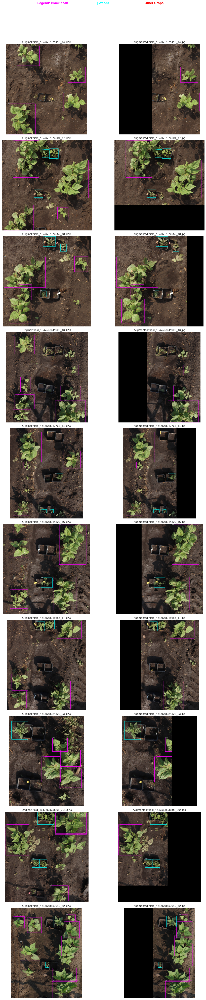

In [49]:
def draw_boxes_on_image(img_path: str, label_path: str):
    
    COLOR_TARGET = (255, 0, 255)   
    COLOR_WEED = (255, 255, 0)     
    COLOR_OTHER = (0, 0, 255)    
    
    COLOR_TEXT_BG = (0, 0, 0)
    
    COLOR_MAP = {
        TARGET_CLASS_ID: COLOR_TARGET
    }
    for weed_id in WEED_CLASS_IDS:
        COLOR_MAP[weed_id] = COLOR_WEED
    
    DEFAULT_COLOR = COLOR_OTHER 
    
    image = cv2.imread(str(img_path))
    if image is None:
        return np.zeros((480, 480, 3), dtype=np.uint8) 
        
    h, w, _ = image.shape
    labels = parse_yolo_annotation(label_path) 
    
    for ann in labels:
        class_id = ann['class_id']
        
        name = "Unknown"
        if isinstance(CLASS_NAMES, dict):
            name = CLASS_NAMES.get(str(class_id), "Unknown")
        elif isinstance(CLASS_NAMES, list):
            if class_id < len(CLASS_NAMES):
                name = CLASS_NAMES[class_id]

        color = COLOR_MAP.get(class_id, DEFAULT_COLOR)
        
        x_c, y_c = ann['x_center'], ann['y_center']
        w_norm, h_norm = ann['width'], ann['height']
        
        xmin = int((x_c - w_norm / 2) * w)
        xmax = int((x_c + w_norm / 2) * w)
        ymin = int((y_c - h_norm / 2) * h)
        ymax = int((y_c + h_norm / 2) * h)
 
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 7) 

        (text_w, text_h), _ = cv2.getTextSize(name, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
        cv2.rectangle(image, (xmin, ymin - 20), (xmin + text_w, ymin), COLOR_TEXT_BG, -1)

        cv2.putText(image, name, (xmin, ymin - 5), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
                    
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


if not augmented_example_paths:
    print("No images were augmented. Nothing to display.")
else:
    num_examples = len(augmented_example_paths)
    fig, axes = plt.subplots(num_examples, 2, figsize=(15, num_examples * 6))

    fig.text(0.30, 0.99, f"Legend: {CROP_TYPE}", color='magenta', ha='center', fontsize=14, weight='bold')
    fig.text(0.50, 0.99, "| Weeds", color='cyan', ha='center', fontsize=14, weight='bold')
    fig.text(0.70, 0.99, "| Other Crops", color='red', ha='center', fontsize=14, weight='bold')

    if num_examples == 1:
        axes = np.array([axes])

    for i, (orig_img_p, orig_lbl_p, aug_img_p, aug_lbl_p) in enumerate(augmented_example_paths):

        img_original_rgb = draw_boxes_on_image(orig_img_p, orig_lbl_p)
        img_augmented_rgb = draw_boxes_on_image(aug_img_p, aug_lbl_p)

        ax_orig = axes[i, 0]
        ax_orig.imshow(img_original_rgb)
        ax_orig.set_title(f"Original: {Path(orig_img_p).name}")
        ax_orig.axis('off')

        ax_aug = axes[i, 1]
        ax_aug.imshow(img_augmented_rgb)
        ax_aug.set_title(f"Augmented: {Path(aug_img_p).name}")
        ax_aug.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

### Visual Validation

The following visualization displays before/after pairs of augmented images with color-coded bounding boxes:

**Color Legend:**
- **Magenta**: Target crop (Black bean)
- **Cyan**: Weed instances
- **Red**: Other crop species

This visual inspection confirms:
- Weeds are maximally preserved with minimal instance loss (<1% across dataset)
- Only peripheral crops within edge zones are removed
- Image dimensions are maintained through black padding
- Label accuracy is preserved with coordinate recalculation

### Algorithm pipeline

1. Objective    

    The primary goal of this algorithm is to perform intelligent undersampling on a class-imbalanced object detection dataset. It aims to reduce the instance count of a specified majority class (the selected target crop) while adhering to one critical constraint: no minority class instance (weeds) may be removed or partially clipped.

    This is achieved by iteratively cropping "unimportant" majority-class instances from the image borders and replacing the cropped area with black padding, thus preserving image dimensions.    

2. The Main Pipeline (Iterative Loop)

    The algorithm processes the entire dataset image by image. For each image, it enters an iterative while loop that performs the following steps:
    * Analyze Image: The algorithm analyzes the current state of the image and its labels.
    * Find Best Target: It executes the find_candidate_to_crop function to find the single best target crop instance to remove.   

    Check for Target:
    * If a safe target is found: The algorithm executes the apply_crop_and_pad function. This creates a new, cropped version of the image. This new image then becomes the input for the next iteration of the while loop (Step 1).
    * If no safe target is found: The while loop breaks.   

    Save Result: The final version of the image (either the augmented one or the original if no cuts were made) is saved to the augmented directory.

    This iterative process allows the algorithm to perform multiple cuts on a single image (e.g., removing an entire row, one piece at a time) until no "safe" cuts remain.

3. Core Logic: Candidate Selection 

    This section describes the find_candidate_to_crop function, which finds the single best target for removal.   

    Filtering: The function first identifies all target crop instances and filters them based on two rules:
    * Edge Filter: It keeps only crop boxes that are near an image border (defined by EDGE_THRESHOLD).
    * Proximity Filter: It discards any crop box that is too close to a weed (defined by WEED_DISTANCE_THRESHOLD). This protects instances that are actively interacting with a weed.   

    Ultimate Safety Check (is_cut_safe): This is the most critical logic. For every crop candidate that passes the filters, the algorithm performs a full "safety simulation":
    * It simulates the exact cut line that apply_crop_and_pad would create.
    * It checks this line against every weed box on the entire image.
    * If the cut would clip or remove even a single pixel of any weed, the candidate is deemed "unsafe" and is discarded.

    Final Selection (The "Best" Candidate):
    * After the safety check, the algorithm may have multiple "safe" candidates.
    * It calculates the distance from each safe candidate to its nearest weed.
    * It selects only the one candidate that is farthest from any weed. This is considered the "least valuable" instance on the image and is the only target selected for this iteration.

4. Core Logic: Cropping & Padding

    This section describes the apply_crop_and_pad function, which executes the cut.

    Intelligent Cut: The function does not just cut at the trigger box's edge. It scans for all other crop boxes in the same row and sets the cut line at the "deepest" edge of the entire row. This ensures the whole group is removed cleanly, not one-by-one.

    "Protect Last Row" Logic: A critical safety check. If the algorithm detects that all crop instances on the image are in the target cut zone (e.g., all crops are in one row on the right), it modifies the cut line to preserve the single deepest row. This guarantees that at least one crop instance will always remain on the final image, preventing "weed-only" images.

    Padding: The resulting "safe" portion of the image is copied onto a new black canvas that matches the original_h and original_w.

    Label Recalculation & "Sliver" Removal:
    * All labels (both crop and weed) are recalculated based on the new "safe" area.
    * Any crop box that has less than MIN_BOX_AREA_PERCENTAGE (25%) of its original area after the cut is considered a "sliver" and is deleted from the final label file, as it provides no training value.
    * Weed labels are preserved, as they were already guaranteed to be 100% intact by the is_cut_safe function.

    Final Safety Check: As a final precaution, the function checks whether any Crop instances remain after the cut.
    If no Crop boxes are present, the function simply cancels this cut and returns the original image and original labels unchanged.

### Create YAML Config File

### YOLO Configuration Files

Generating two configuration files for comparative analysis:

1. **{crop}_augmented.yaml**: Points to `train_aug` folder (undersampled dataset)
2. **{crop}_original.yaml**: Points to `train` folder (original unbalanced dataset)

These configurations enable direct comparison of model performance with and without augmentation, supporting ablation study objectives.

In [50]:
classes_txt_path = SPLIT_DIR / 'classes.txt'
with open(classes_txt_path) as f:
    CLASS_NAMES = [line.strip() for line in f]

yaml_content = f"""
path: {SPLIT_DIR.resolve()}

train: train_aug
val: valid
test: test  

nc: {len(CLASS_NAMES)}
names: {CLASS_NAMES}
"""

crop_type_normalized = CROP_TYPE.lower().replace(" ", "_")
yaml_path = SPLIT_DIR / f"{crop_type_normalized}_augmented.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_content)

print(f"YOLO config saved to: {yaml_path}")

YOLO config saved to: Weed-crop RGB dataset\Black bean_augmented\black_bean_augmented.yaml


In [51]:
classes_txt_path = SPLIT_DIR / 'classes.txt'
with open(classes_txt_path) as f:
    CLASS_NAMES = [line.strip() for line in f]

yaml_content = f"""
path: {SPLIT_DIR.resolve()}

train: train
val: valid
test: test  

nc: {len(CLASS_NAMES)}
names: {CLASS_NAMES}
"""

# Use dynamic crop type for filename (lowercase and replace spaces with underscores)
crop_type_normalized = CROP_TYPE.lower().replace(" ", "_")
yaml_path = SPLIT_DIR / f"{crop_type_normalized}_original.yaml"
with open(yaml_path, "w") as f:
    f.write(yaml_content)

print(f"YOLO config saved to: {yaml_path}")

YOLO config saved to: Weed-crop RGB dataset\Black bean_augmented\black_bean_original.yaml


## Export Class Balance Summary

### Quantitative Analysis

The final statistics export provides comprehensive class distribution data across all splits and augmentation states:

**Metrics Included:**
- Train (original)
- Train (augmented)
- Validation
- Test

This JSON export facilitates:
- Automated comparison scripts
- Reproducibility documentation
- Statistical analysis in subsequent notebooks
- Publication-ready data reporting

In [52]:
def compute_class_distribution(label_dir):
    """
    Counts all class instances in a given directory 
    (assuming a flat structure).
    """
    counts = Counter()
    label_files = [f for f in label_dir.glob("*.txt") if f.name != 'classes.txt']
    
    if not label_files:
        print(f"Warning: No .txt files found in {label_dir}")
        return counts

    for lbl_path in label_files:
        with open(lbl_path) as f:
            for line in f:
                try:
                    cls_id = int(line.split()[0])
                    counts[cls_id] += 1
                except (IndexError, ValueError):
                    print(f"Skipping malformed line in {lbl_path.name}")
    return counts

dist = {
    "train": compute_class_distribution(SPLIT_DIR / "train"),
    "train_augmented": compute_class_distribution(SPLIT_DIR / "train_aug"),
    "valid": compute_class_distribution(SPLIT_DIR / "valid"),
    "test": compute_class_distribution(SPLIT_DIR / "test")
}

crop_type_normalized = CROP_TYPE.lower().replace(" ", "_")
stats_path = SPLIT_DIR / f"{crop_type_normalized}_stats.json"
with open(stats_path, "w") as f:
    json.dump(dist, f, indent=4)

print(f"Class distribution saved to: {stats_path}")
print("\nFinal Statistics (JSON content):")
print(json.dumps(dist, indent=4))

Class distribution saved to: Weed-crop RGB dataset\Black bean_augmented\black_bean_stats.json

Final Statistics (JSON content):
{
    "train": {
        "0": 1382,
        "9": 68,
        "12": 77,
        "5": 38,
        "6": 72,
        "8": 77,
        "10": 14
    },
    "train_augmented": {
        "0": 715,
        "9": 68,
        "12": 77,
        "5": 38,
        "6": 72,
        "8": 77,
        "10": 13
    },
    "valid": {
        "8": 20,
        "0": 313,
        "12": 17,
        "6": 20,
        "9": 6,
        "5": 9,
        "10": 3
    },
    "test": {
        "0": 266,
        "6": 15,
        "9": 10,
        "7": 1,
        "12": 14,
        "8": 20,
        "5": 5,
        "4": 3,
        "10": 4
    }
}
